# Hi! I'm Ankush Pramanik
## I will be exploring a taxis dataset and will be showing you basic exploration of dataset & EDA

# Exploring the Dataset

In [3]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

# Load your dataset into a DataFrame
df = pd.read_csv("/content/taxis.csv")

# Print the number of rows and columns
print("Number of rows and columns:", df.shape)

# Print out the first five rows
df.head()

Number of rows and columns: (6433, 14)


,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan


## Understanding columns and values

The [info()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.info.html) function prints a concise summary of the DataFrame. For each column, you can find its name, data type, and the number of non-null rows.  This is useful to gauge if there are many missing values and to understand what data types you're dealing with. 

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6433 entries, 0 to 6432
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   pickup           6429 non-null   object 
 1   dropoff          6429 non-null   object 
 2   passengers       6433 non-null   int64  
 3   distance         6430 non-null   float64
 4   fare             6433 non-null   float64
 5   tip              6432 non-null   float64
 6   tolls            6431 non-null   float64
 7   total            6433 non-null   float64
 8   color            6431 non-null   object 
 9   payment          6387 non-null   object 
 10  pickup_zone      6404 non-null   object 
 11  dropoff_zone     6388 non-null   object 
 12  pickup_borough   6405 non-null   object 
 13  dropoff_borough  6388 non-null   object 
dtypes: float64(5), int64(1), object(8)
memory usage: 703.7+ KB


To get an exact count of missing values in each column, call the [isna()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.isna.html) function and aggregate it using the [sum()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sum.html) function:

In [5]:
df.isna().sum()

pickup              4
dropoff             4
passengers          0
distance            3
fare                0
tip                 1
tolls               2
total               0
color               2
payment            46
pickup_zone        29
dropoff_zone       45
pickup_borough     28
dropoff_borough    45
dtype: int64

If there are missing values, you'll have to decide if and how missing values should be dealt with. If you want to learn more about removing and replacing values.


The [describe()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html) function generates helpful descriptive statistics for each numeric column. You can see the percentile, mean, standard deviation, and minimum and maximum values in its output. Note that missing values are excluded here.

In [6]:
df.describe()

,passengers,distance,fare,tip,tolls,total
count,6433.000000,6430.000000,6433.000000,6432.000000,6431.000000,6433.000000
mean,1.539251,3.023526,13.091073,1.979176,0.325374,18.517794
std,1.203768,3.827513,11.551804,2.448747,1.415476,13.815570
min,0.000000,0.000000,1.000000,0.000000,0.000000,1.300000
25%,1.000000,0.980000,6.500000,0.000000,0.000000,10.800000
50%,1.000000,1.640000,9.500000,1.700000,0.000000,14.160000
75%,2.000000,3.210000,15.000000,2.800000,0.000000,20.300000
max,6.000000,36.700000,150.000000,33.200000,24.020000,174.820000


Use the [`unique()`](https://pandas.pydata.org/docs/reference/api/pandas.unique.html) function to print out the unique values of a column:

In [7]:
df["pickup_borough"].unique()  # Replace with a column of interest

array(['Manhattan', 'Queens', nan, 'Bronx', 'Brooklyn'], dtype=object)

Use the [`value_counts()`](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html) function to print out the number of rows for each unique value:

In [8]:
df["pickup_borough"].value_counts(  # Replace with a column of interest
    dropna=True  # Set to False if you want to include NaN values
)

Manhattan    5266
Queens        657
Brooklyn      383
Bronx          99
Name: pickup_borough, dtype: int64

## Basic data visualizations

pandas' [plot()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html) function makes it easy to plot columns from your DataFrame. This section will go through a few basic data visualizations to better understand your data.


Boxplots can help you identify outliers:

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


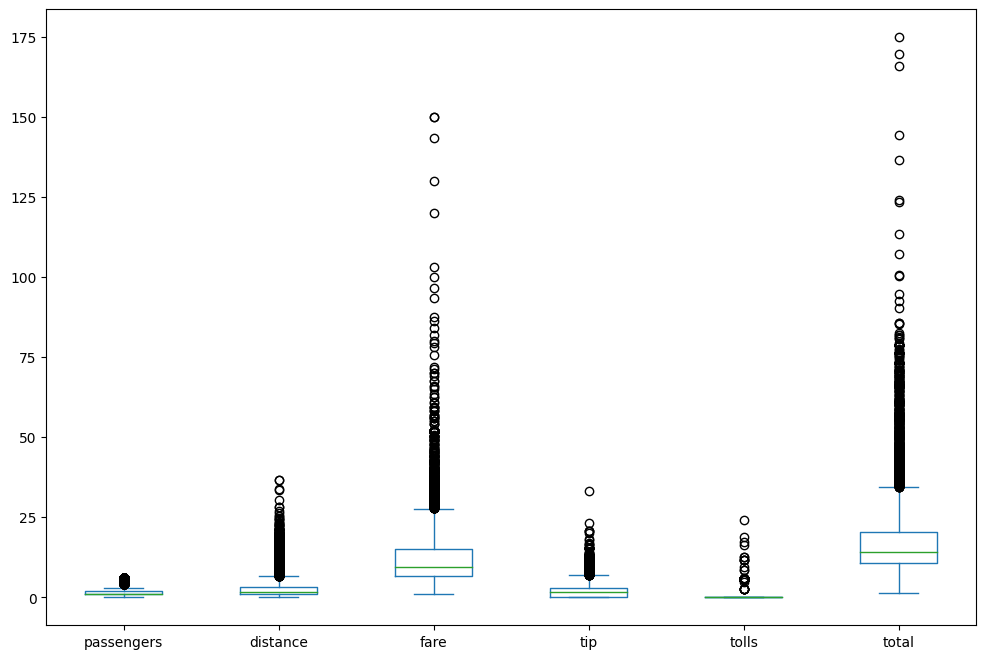

In [9]:
import matplotlib as plt
df.plot(
    kind="box", figsize=(12, 8)  # Specifies a boxplot with set width & height in inches
);

To further inspect distribution of data in a column, you can use a histogram:

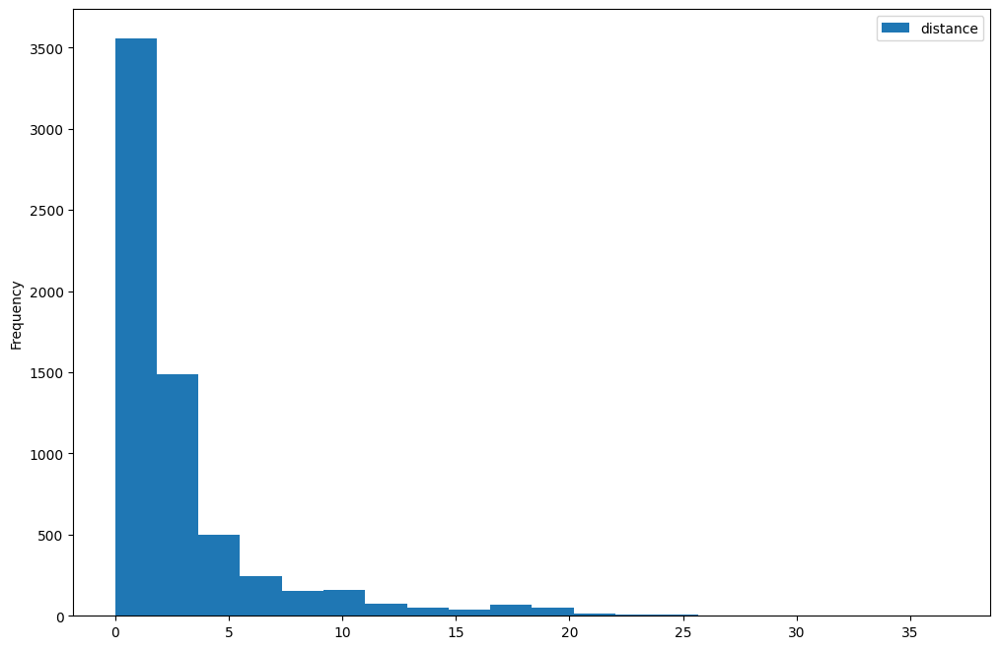

In [10]:
df.plot(
    kind="hist",  # Specifies a histogram
    y="distance",  # Replace with a numeric column of interest
    bins=20,  # Set the number of bins in the histogram
    figsize=(12, 8)  # Set width & height in inches
);

You can use a bar plot to compare averages (and other aggregations!) of a numeric column across a categorical column:

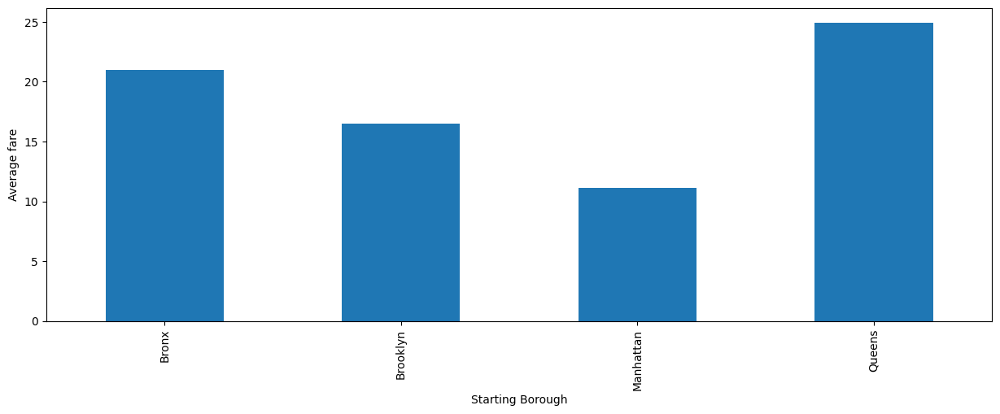

In [11]:
# Create a new DataFrame with a categorical column to group the data and a numeric column to aggregate
# You can also use sum(), count(), and other aggregations instead of mean()
df_bar = df.groupby(["pickup_borough"])["fare"].mean()

df_bar.plot(
    kind="bar",  # Specifies vertical bar plot
    ylabel="Average fare",  # Add a y-axis label
    xlabel="Starting Borough",  # Add a x-axis label
    figsize=(15, 5)  # Set width & height in inches
);

If you have any date columns, you can use a lineplot to find patterns, such as seasonality:

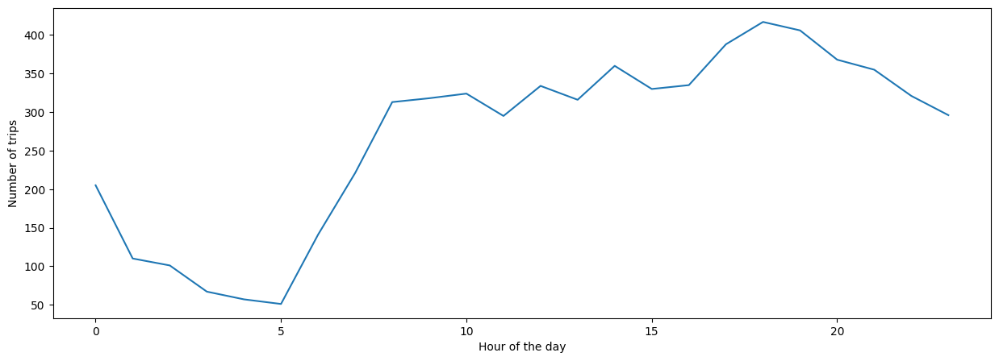

In [12]:
# Convert any date and/or time column to datetime format
df["pickup"] = pd.to_datetime(df["pickup"])

# Create a new DataFrame, group by the datetime column and choose an aggregation
# On the datetime column, choose a time object, options can be found here:
# https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#time-date-components
df_dates = df["pickup"].groupby([df["pickup"].dt.hour]).count()

df_dates.plot(
    kind="line",  # Specifies line plot
    ylabel="Number of trips",  # Add a y-axis label
    xlabel="Hour of the day",  # Add a x-axis label
    figsize=(15, 5)  # Set width & height in inches
);

Scatter plots are useful to investigate the relationship between two numeric variables:

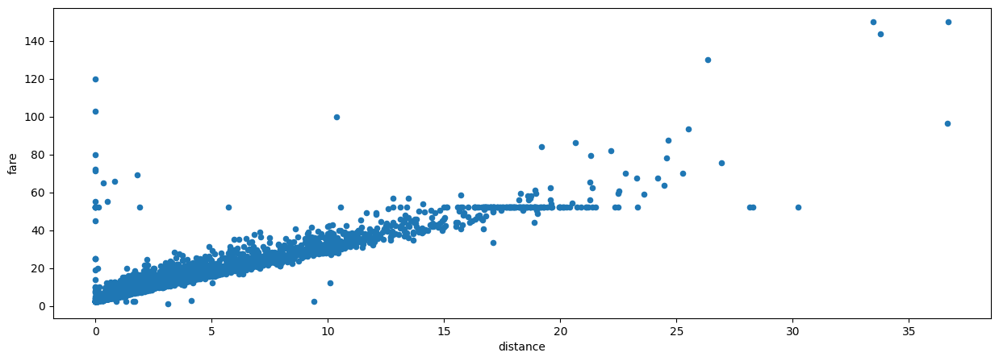

In [13]:
df.plot(
    kind="scatter",  # Specifies a scatter plot
    x="distance",  # Replace with a numeric column for the x-axis
    y="fare",  # Replace with a numeric column for the y-axis
    figsize=(15, 5)  # Set width & height in inches
);

To further explore relationships between columns, generate a correlation matrix using pandas' [corr()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html) function and a plot it with Seaborn's [heatmap()](https://seaborn.pydata.org/generated/seaborn.heatmap.html) function.

            passengers  distance      fare       tip     tolls     total
passengers    1.000000  0.009545  0.007637  0.021108 -0.002876  0.015708
distance      0.009545  1.000000  0.920111  0.452276  0.635552  0.904675
fare          0.007637  0.920111  1.000000  0.488630  0.609303  0.974358
tip           0.021108  0.452276  0.488630  1.000000  0.413658  0.646199
tolls        -0.002876  0.635552  0.609303  0.413658  1.000000  0.683137
total         0.015708  0.904675  0.974358  0.646199  0.683137  1.000000


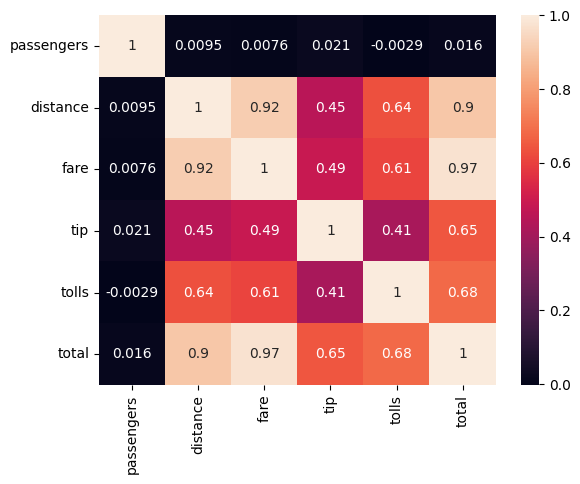

<Figure size 640x480 with 0 Axes>

In [14]:
# Generate and print pairwise correlation of columns
cm = df.corr()
print(cm)

import matplotlib.pyplot as plt

# Plot the correlation matrix nicely using Seaborn
sn.heatmap(cm, annot=True)
plt.show()
plt.clf()

Eager for more visualizations? Take a look at the documentation of the [plot()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html) function to see what other visualizations you can make. You can also learn more about powerful Python visualization libraries, such as [matplotlib](https://app.datacamp.com/learn/courses/introduction-to-data-visualization-with-matplotlib), [seaborn](https://app.datacamp.com/learn/courses/introduction-to-data-visualization-with-seaborn), and [plotly](https://app.datacamp.com/learn/courses/introduction-to-data-visualization-with-plotly-in-python)!

# Now lets see a cool library which can automate the process of EDA
## The library name is autoviz.

### pip installing autoviz

In [15]:
!pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 64 kB 3.1 MB/s 
     |████████████████████████████████| 12.9 MB 43.5 MB/s 
     |████████████████████████████████| 18.5 MB 1.1 MB/s 
     |████████████████████████████████| 3.2 MB 43.7 MB/s 
     |████████████████████████████████| 11.2 MB 41.1 MB/s 
     |████████████████████████████████| 1.7 MB 48.8 MB/s 
     |████████████████████████████████| 216 kB 61.6 MB/s 
     |████████████████████████████████| 960 kB 29.8 MB/s 
     |████████████████████████████████| 1.6 MB 50.9 MB/s 
     |████████████████████████████████| 120 kB 53.9 MB/s 
     |████████████████████████████████| 82 kB 860 kB/s 
  Created wheel for emoji: filename=emoji-2.1.0-py3-none-any.whl size=212392 sha256=44708a673006ac38b733cf0e29aa260cd1d5b023225df21a7d134ed4b1a7ca9e
  Stored in directory: /root/.cache/pip/wheels/77/75/99/51c2a119f4cfd3af7b49cc57e4f737bed7e40b348a85d82804
Successfu

## Now executing the autoviz library 

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (6433, 14)
#######################################################################################
######################## C L A S S 

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
dropoff,6421,object,4,0.062179,99.813462,1,"combine rare categories, fill missing, fix mixed data types"
pickup,6410,object,4,0.062179,99.642469,1,"combine rare categories, fill missing, fix mixed data types"
distance,1078,float64,3,0.046635,16.757345,0,"fill missing, skewed: cap or drop outliers"
total,898,float64,0,0.000000,13.959273,0,skewed: cap or drop outliers
tip,489,float64,1,0.015545,7.601430,0,"fill missing, skewed: cap or drop outliers"
fare,220,float64,0,0.000000,3.419866,0,skewed: cap or drop outliers
dropoff_zone,203,object,45,0.699518,3.155604,1,"combine rare categories, fill missing, fix mixed data types"
pickup_zone,194,object,29,0.450801,3.015700,1,"combine rare categories, fill missing, fix mixed data types"
tolls,16,float64,2,0.031090,0.248718,0,"fill missing, highly skewed: drop outliers or do box-cox transform"
passengers,7,int64,0,0.000000,0.108814,0,


    14 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 15


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

All Plots done
Time to run AutoViz = 38 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


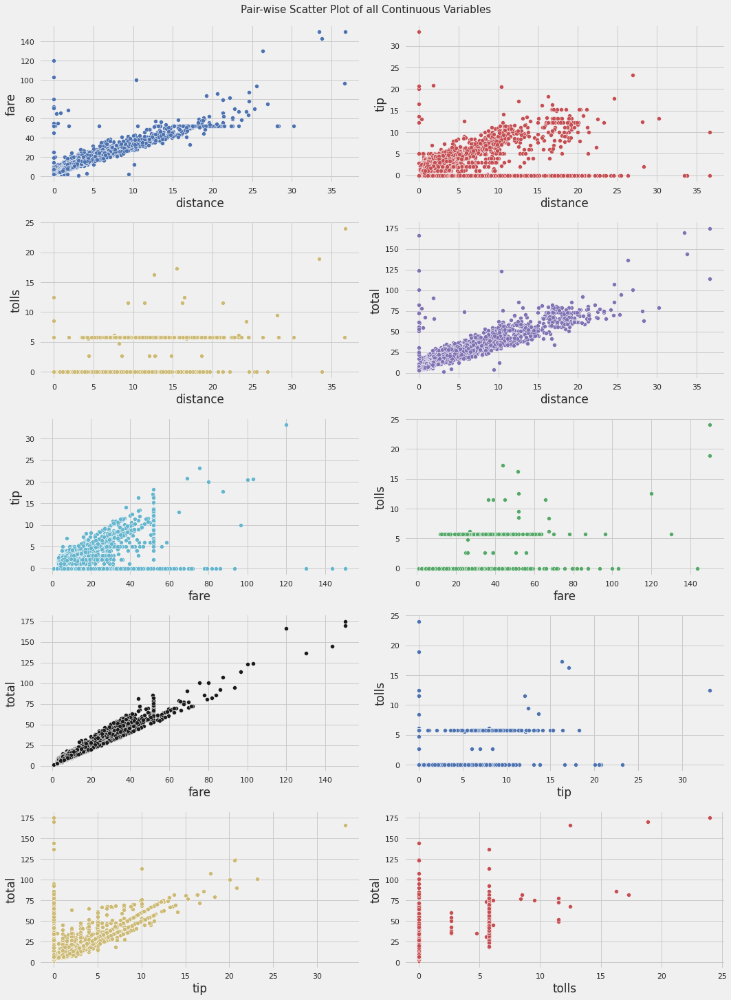

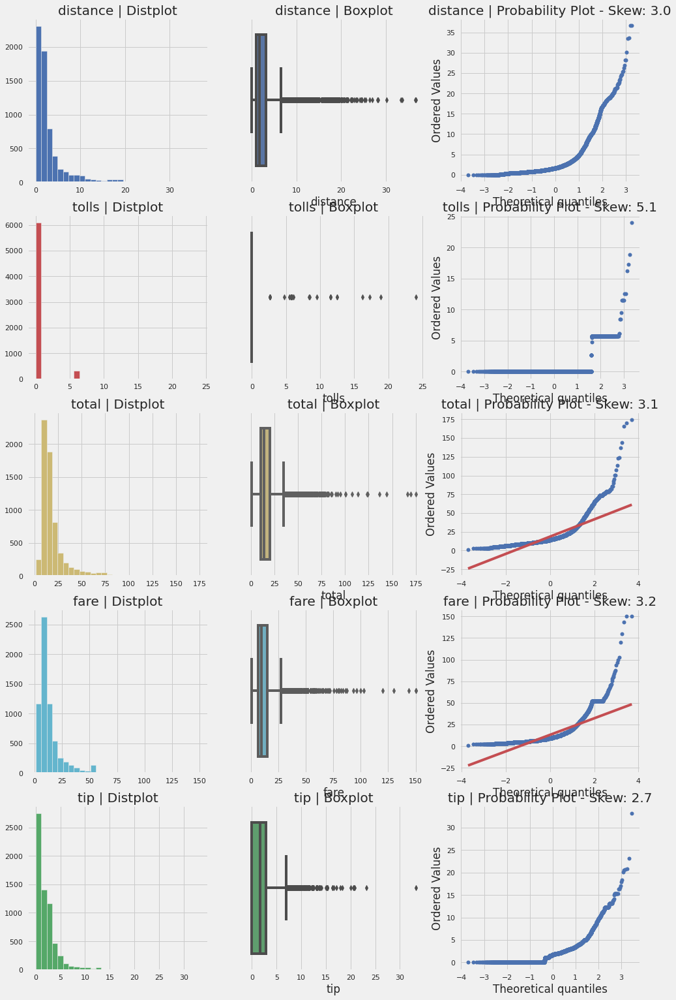

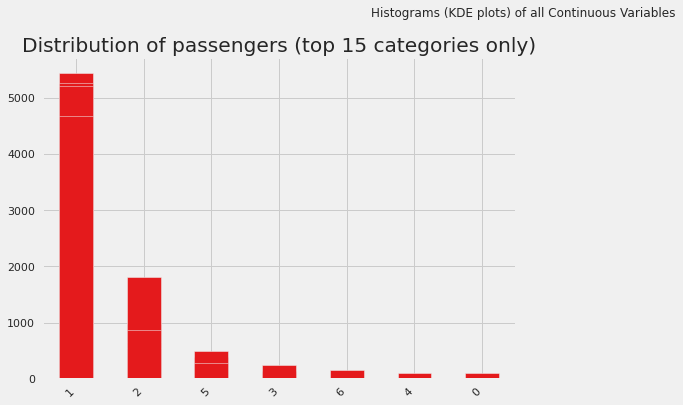

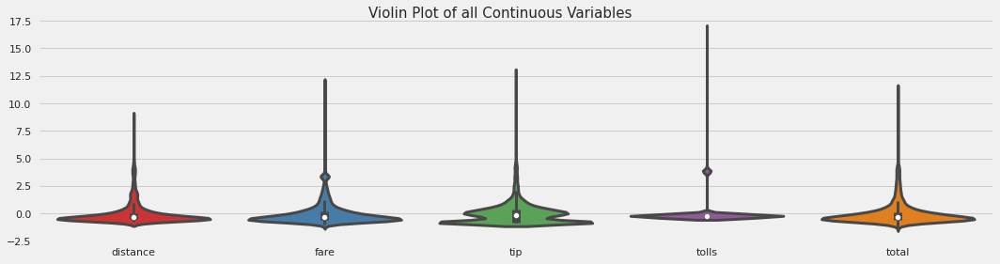

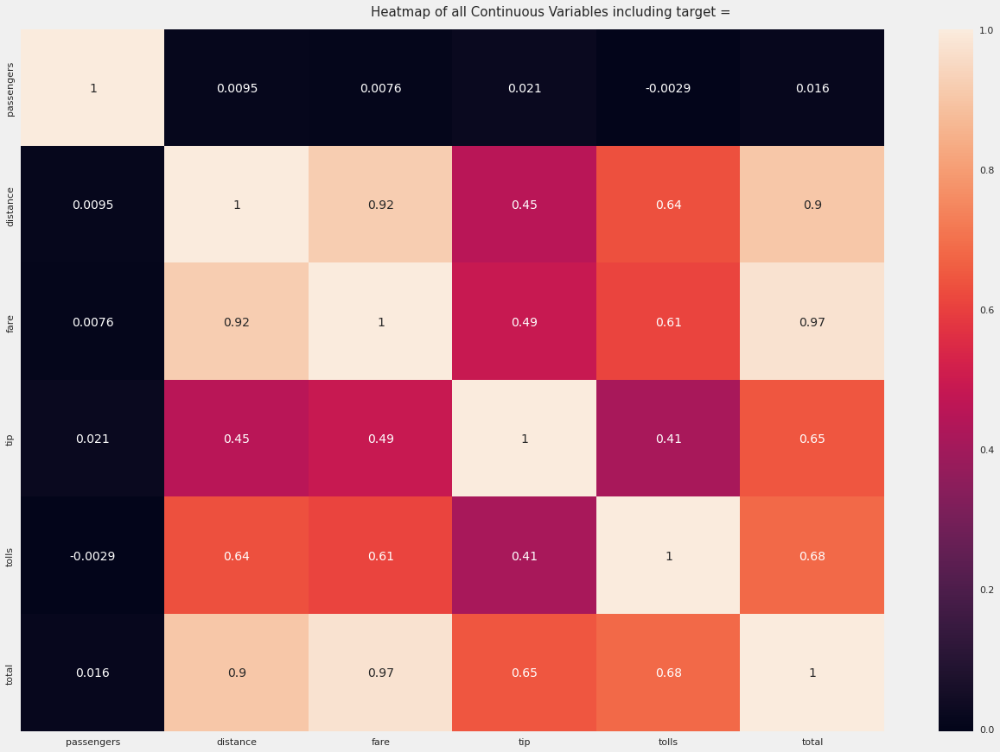

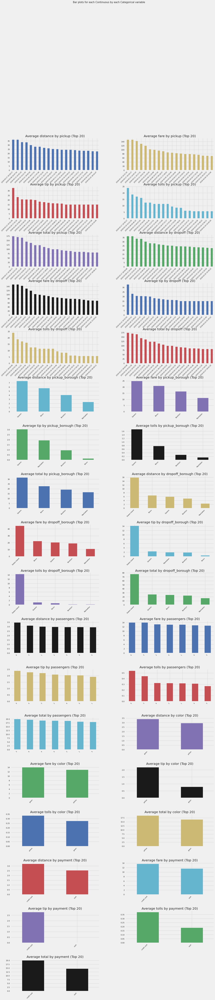

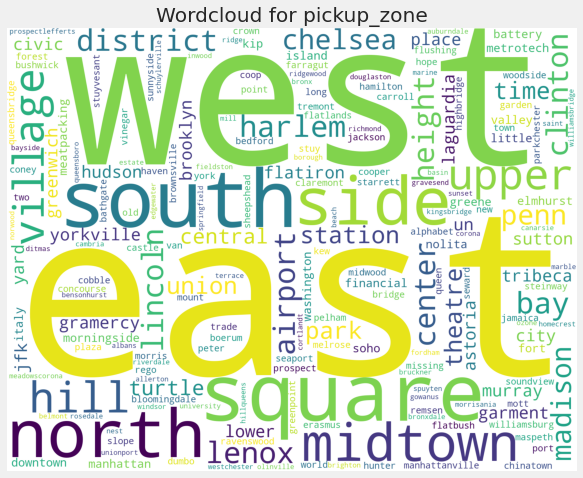

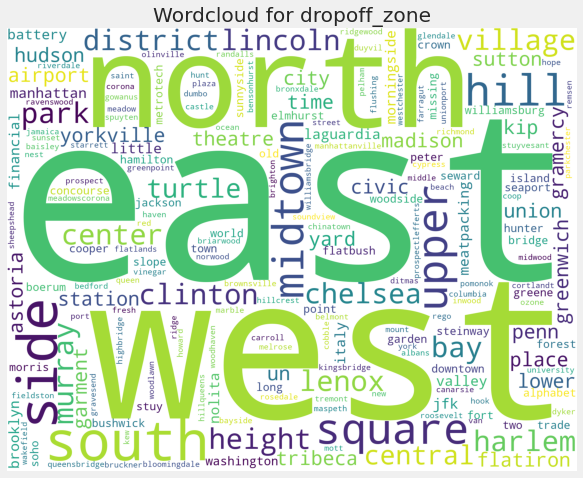

In [16]:
%matplotlib inline
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
filename="/content/taxis.csv"
dft=AV.AutoViz(filename)

# Amazing right?
## Autoviz gives us everything we need in few lines of codes to understand the data and EDA.

# Now let's see another amazing library called D-Tale

### pip installing D-Tale

In [17]:
pip install dtale

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.8 MB 13.3 MB/s 
     |████████████████████████████████| 9.8 MB 40.7 MB/s 
     |████████████████████████████████| 79.9 MB 1.2 MB/s 
     |████████████████████████████████| 642 kB 60.3 MB/s 
     |████████████████████████████████| 45 kB 3.4 MB/s 
     |████████████████████████████████| 62 kB 972 kB/s 
     |████████████████████████████████| 40 kB 5.6 MB/s 
     |████████████████████████████████| 216 kB 52.6 MB/s 
     |████████████████████████████████| 1.2 MB 47.7 MB/s 
     |████████████████████████████████| 357 kB 60.8 MB/s 
  Created wheel for dash-colorscales: filename=dash_colorscales-0.0.4-py3-none-any.whl size=62590 sha256=439b548edd8f192aa0bc5c40a9fb5dc2a856ecca0240bb62978d4141d18dd498
  Stored in directory: /root/.cache/pip/wheels/2f/22/7e/183ba2af565e3eb955021fbb4fe8fe4a6b1ed8ae3e5c03236a
  Created wheel for dash-daq: filename=dash_daq-0

## importing dtale

In [18]:
import dtale

In [19]:
import dtale.app as dtale_app
dtale_app.USE_COLAB= True

## executing the dtale giving the df dataset that we have been working on before.

# Click the link below to see and work with D-Tale generated report

In [20]:
dtale.show(df)

https://k1652zef6v-496ff2e9c6d22116-40000-colab.googleusercontent.com/dtale/main/1

https://k1652zef6v-496ff2e9c6d22116-40000-colab.googleusercontent.com/dtale/main/1

# Let's take a look at one of my favourite library 
## Dataprep

### pip installing dataprep

In [ ]:
!pip install dataprep

### Executing the dataprep library with the taxis dataset which is initalized in dataframe df

DataPrep Report
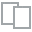
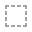
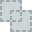
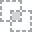
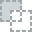
...
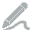
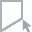
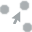
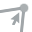
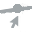

In [4]:
from dataprep.eda import create_report
%matplotlib inline
import seaborn as sns
create_report(df)